In [106]:
import pandas as pd
from ucimlrepo import fetch_ucirepo
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import seaborn as sns
import plotly.subplots as sp
import plotly.graph_objects as go
import numpy as np
import scipy.stats as stats
import os
from geopy.geocoders import Nominatim
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from IPython.display import display, Math
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from mlxtend.frequent_patterns import apriori, association_rules

In [116]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Data Set

In [43]:
dataset = fetch_ucirepo(id=373)

# Convert to DataFrame
df_features = dataset.data.features
df_target = dataset.data.targets 

In [45]:
df_features

,age,gender,education,country,ethnicity,nscore,escore,oscore,ascore,cscore,impuslive,ss
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575
2,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148
3,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084
4,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575
...,...,...,...,...,...,...,...,...,...,...,...,...
1880,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173
1881,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540
1882,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593
1883,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,-2.57309,1.29221,1.22470


In [47]:
df_target

,alcohol,amphet,amyl,benzos,caff,cannabis,choc,coke,crack,ecstasy,heroin,ketamine,legalh,lsd,meth,mushrooms,nicotine,semer,vsa
0,CL5,CL2,CL0,CL2,CL6,CL0,CL5,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,CL5,CL2,CL2,CL0,CL6,CL4,CL6,CL3,CL0,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,CL6,CL0,CL0,CL0,CL6,CL3,CL4,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,CL4,CL0,CL0,CL3,CL5,CL2,CL4,CL2,CL0,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,CL4,CL1,CL1,CL0,CL6,CL3,CL6,CL0,CL0,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,CL5,CL0,CL0,CL0,CL4,CL5,CL4,CL0,CL0,CL0,CL0,CL0,CL3,CL3,CL0,CL0,CL0,CL0,CL5
1881,CL5,CL0,CL0,CL0,CL5,CL3,CL4,CL0,CL0,CL2,CL0,CL0,CL3,CL5,CL4,CL4,CL5,CL0,CL0
1882,CL4,CL6,CL5,CL5,CL6,CL6,CL6,CL4,CL0,CL4,CL0,CL2,CL0,CL2,CL0,CL2,CL6,CL0,CL0
1883,CL5,CL0,CL0,CL0,CL6,CL6,CL5,CL0,CL0,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL4,CL0,CL0


In [53]:
df_target.columns

Index(['alcohol', 'amphet', 'amyl', 'benzos', 'caff', 'cannabis', 'choc',
       'coke', 'crack', 'ecstasy', 'heroin', 'ketamine', 'legalh', 'lsd',
       'meth', 'mushrooms', 'nicotine', 'semer', 'vsa'],
      dtype='object')

In [57]:
df_features.columns

Index(['age', 'gender', 'education', 'country', 'ethnicity', 'nscore',
       'escore', 'oscore', 'ascore', 'cscore', 'impuslive', 'ss'],
      dtype='object')

In [59]:
print(df_features.isnull().sum())

age          0
gender       0
education    0
country      0
ethnicity    0
nscore       0
escore       0
oscore       0
ascore       0
cscore       0
impuslive    0
ss           0
dtype: int64


In [61]:
print(df_target.isnull().sum())

alcohol      0
amphet       0
amyl         0
benzos       0
caff         0
cannabis     0
choc         0
coke         0
crack        0
ecstasy      0
heroin       0
ketamine     0
legalh       0
lsd          0
meth         0
mushrooms    0
nicotine     0
semer        0
vsa          0
dtype: int64


In [63]:
df_target.describe()

,alcohol,amphet,amyl,benzos,caff,cannabis,choc,coke,crack,ecstasy,heroin,ketamine,legalh,lsd,meth,mushrooms,nicotine,semer,vsa
count,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885
unique,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,7
top,CL5,CL0,CL0,CL0,CL6,CL6,CL6,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL6,CL0,CL0
freq,759,976,1305,1000,1385,463,807,1038,1627,1021,1605,1490,1094,1069,1429,982,610,1877,1455


In [65]:
df_features.describe()

,age,gender,education,country,ethnicity,nscore,escore,oscore,ascore,cscore,impuslive,ss
count,1885.00000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000
mean,0.03461,-0.000256,-0.003806,0.355542,-0.309577,0.000047,-0.000163,-0.000534,-0.000245,-0.000386,0.007216,-0.003292
std,0.87836,0.482588,0.950078,0.700335,0.166226,0.998106,0.997448,0.996229,0.997440,0.997523,0.954435,0.963701
min,-0.95197,-0.482460,-2.435910,-0.570090,-1.107020,-3.464360,-3.273930,-3.273930,-3.464360,-3.464360,-2.555240,-2.078480
25%,-0.95197,-0.482460,-0.611130,-0.570090,-0.316850,-0.678250,-0.695090,-0.717270,-0.606330,-0.652530,-0.711260,-0.525930
50%,-0.07854,-0.482460,-0.059210,0.960820,-0.316850,0.042570,0.003320,-0.019280,-0.017290,-0.006650,-0.217120,0.079870
75%,0.49788,0.482460,0.454680,0.960820,-0.316850,0.629670,0.637790,0.723300,0.760960,0.584890,0.529750,0.765400
max,2.59171,0.482460,1.984370,0.960820,1.907250,3.273930,3.273930,2.901610,3.464360,3.464360,2.901610,1.921730


In [84]:
df.dtypes

ID                      int64
Age                   float64
Gender                float64
Education             float64
Country               float64
Ethnicity             float64
Nscore                float64
Escore                float64
Oscore                float64
Ascore                float64
Cscore                float64
Impulsiveness         float64
SensationSeeking      float64
Alcohol                object
Amphetamines           object
AmylNitrite            object
Benzodiazepines        object
Caffeine               object
Cannabis               object
Chocolate              object
Cocaine                object
Crack                  object
Ecstasy                object
Heroin                 object
Ketamine               object
LegalHighs             object
LSD                    object
Methadone              object
Mushrooms              object
Nicotine               object
Semer                  object
VolatileSubstances     object
dtype: object

# EDA

In [96]:
def extract_cat_num(df):
    cat_col=[col for col in df.columns if df[col].dtype=='object']
    num_col=[col for col in df.columns if df[col].dtype!='object']
    return cat_col,num_col

In [98]:
cat_col,num_cols=extract_cat_num(df)

In [100]:
for col in cat_col:
    print('{} has {} values '.format(col,df[col].unique()))
    print('\n')

Alcohol has ['CL5' 'CL6' 'CL4' 'CL2' 'CL1' 'CL0' 'CL3'] values 


Amphetamines has ['CL2' 'CL0' 'CL1' 'CL3' 'CL5' 'CL4' 'CL6'] values 


AmylNitrite has ['CL0' 'CL2' 'CL1' 'CL3' 'CL5' 'CL4' 'CL6'] values 


Benzodiazepines has ['CL2' 'CL0' 'CL3' 'CL1' 'CL4' 'CL5' 'CL6'] values 


Caffeine has ['CL6' 'CL5' 'CL4' 'CL3' 'CL0' 'CL1' 'CL2'] values 


Cannabis has ['CL0' 'CL4' 'CL3' 'CL2' 'CL1' 'CL6' 'CL5'] values 


Chocolate has ['CL5' 'CL6' 'CL4' 'CL0' 'CL3' 'CL2' 'CL1'] values 


Cocaine has ['CL0' 'CL3' 'CL2' 'CL1' 'CL6' 'CL5' 'CL4'] values 


Crack has ['CL0' 'CL1' 'CL2' 'CL3' 'CL5' 'CL4' 'CL6'] values 


Ecstasy has ['CL0' 'CL4' 'CL1' 'CL3' 'CL2' 'CL6' 'CL5'] values 


Heroin has ['CL0' 'CL1' 'CL2' 'CL3' 'CL5' 'CL6' 'CL4'] values 


Ketamine has ['CL0' 'CL2' 'CL3' 'CL1' 'CL5' 'CL4' 'CL6'] values 


LegalHighs has ['CL0' 'CL1' 'CL2' 'CL3' 'CL5' 'CL4' 'CL6'] values 


LSD has ['CL0' 'CL2' 'CL1' 'CL3' 'CL4' 'CL5' 'CL6'] values 


Methadone has ['CL0' 'CL3' 'CL1' 'CL6' 'CL4' 'CL2' 'CL5'] 

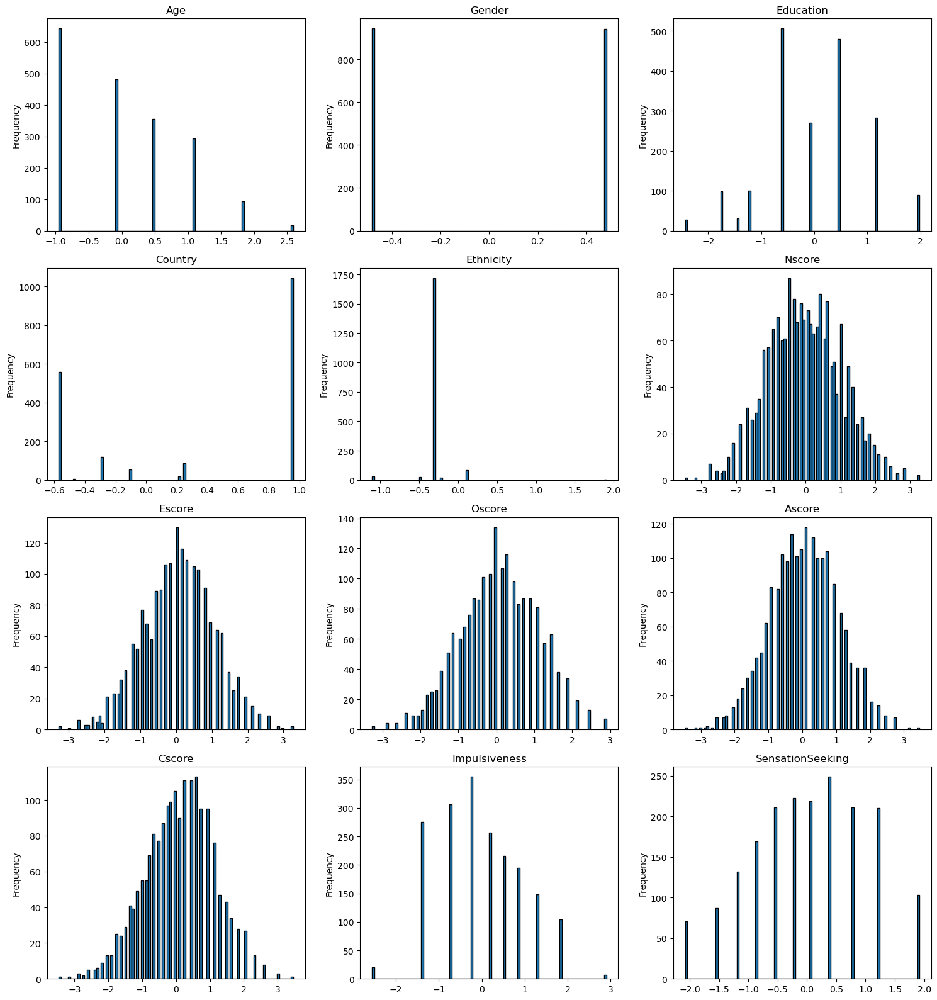

In [73]:
numeric_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numeric_vars = [col for col in numeric_vars if col not in ['ID']]
num_vars_to_plot = min(len(numeric_vars), 23)
num_cols = 3 
num_rows = (num_vars_to_plot // num_cols) + (num_vars_to_plot % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))
axes = axes.flatten()
for i, col in enumerate(numeric_vars[:num_vars_to_plot]):
    axes[i].hist(df[col].dropna(), bins=100, edgecolor='black')
    axes[i].set_title(col)
    axes[i].set_ylabel("Frequency")
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

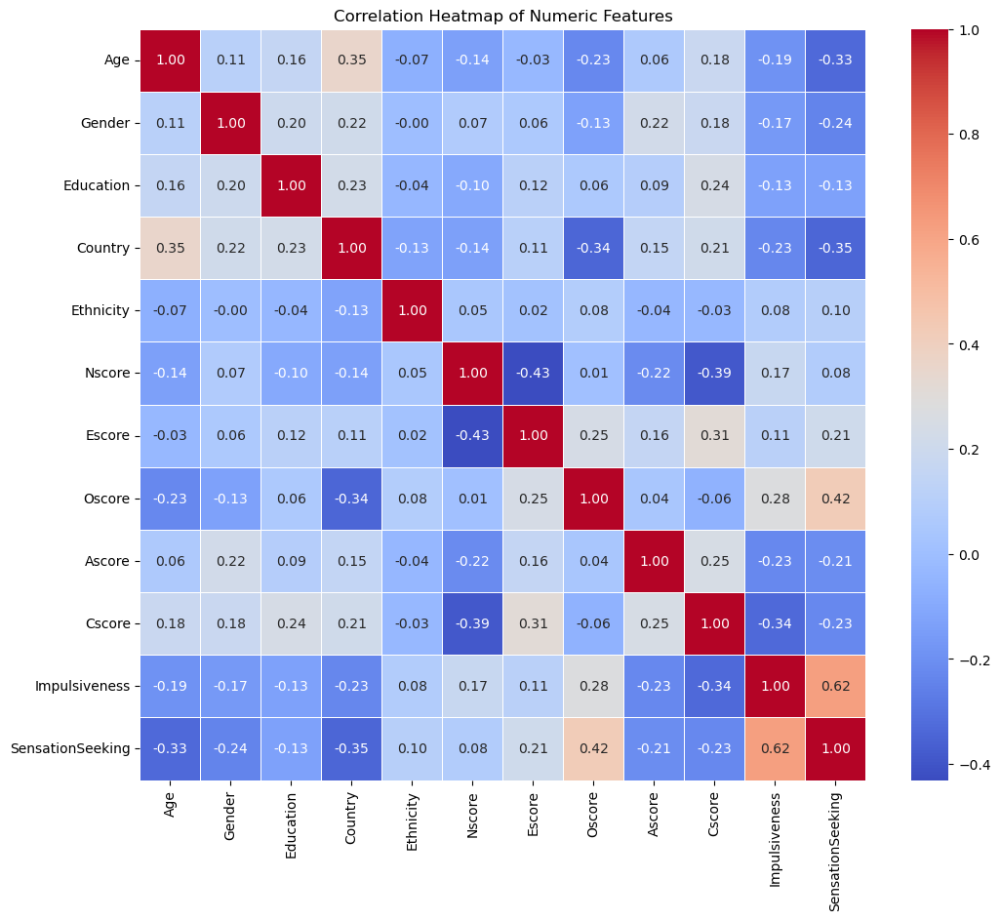

In [88]:
numeric_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numeric_vars = [col for col in numeric_vars if col != 'ID']
correlation_matrix = df[numeric_vars].corr(method='pearson')
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Numeric Features")
plt.show()


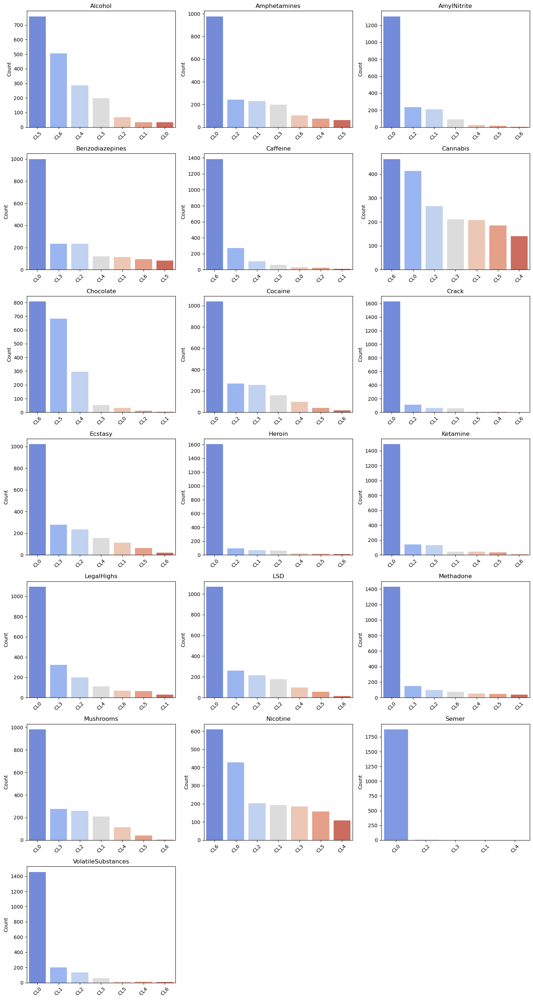

In [120]:
cat_vars = df.select_dtypes(include=['object']).columns.tolist()
num_vars_to_plot = min(len(cat_vars), 23)

num_cols = 3
num_rows = (num_vars_to_plot // num_cols) + (num_vars_to_plot % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))
axes = axes.flatten()

for i, col in enumerate(cat_vars[:num_vars_to_plot]):
    sns.countplot(x=df[col], order=df[col].value_counts().index, ax=axes[i], palette="coolwarm")
    axes[i].set_title(col)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis='x', rotation=45)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [158]:
trait_scores = ['Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsiveness', 'SensationSeeking'] 

# Violin plot Drug uses persanality traits vs scores

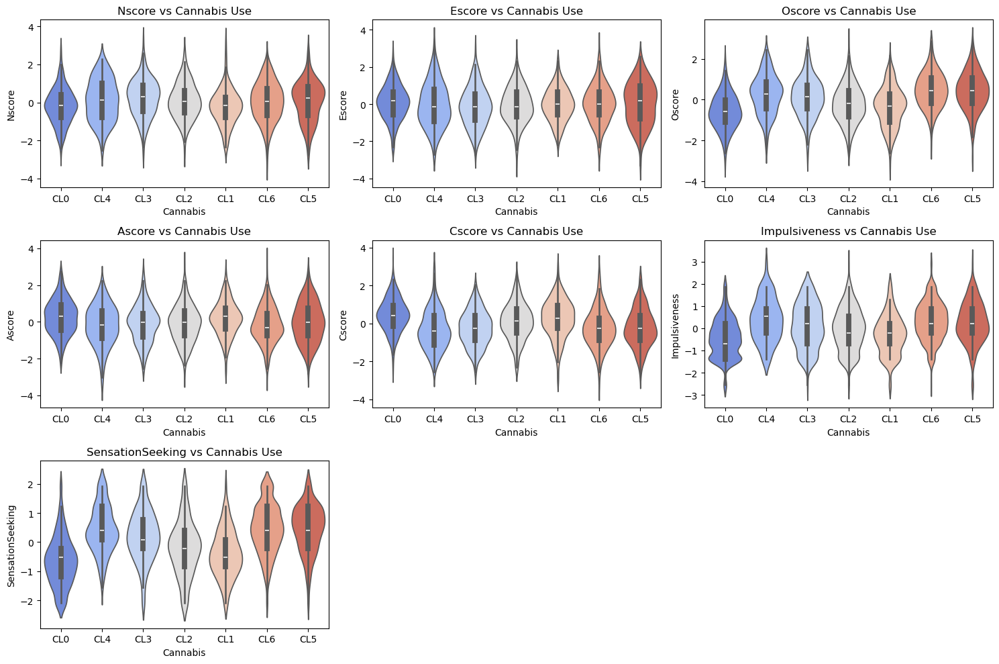

In [160]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = math.ceil(num_vars / num_cols)

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1) 
    sns.violinplot(x=df["Cannabis"], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Cannabis Use")

plt.tight_layout()
plt.show()

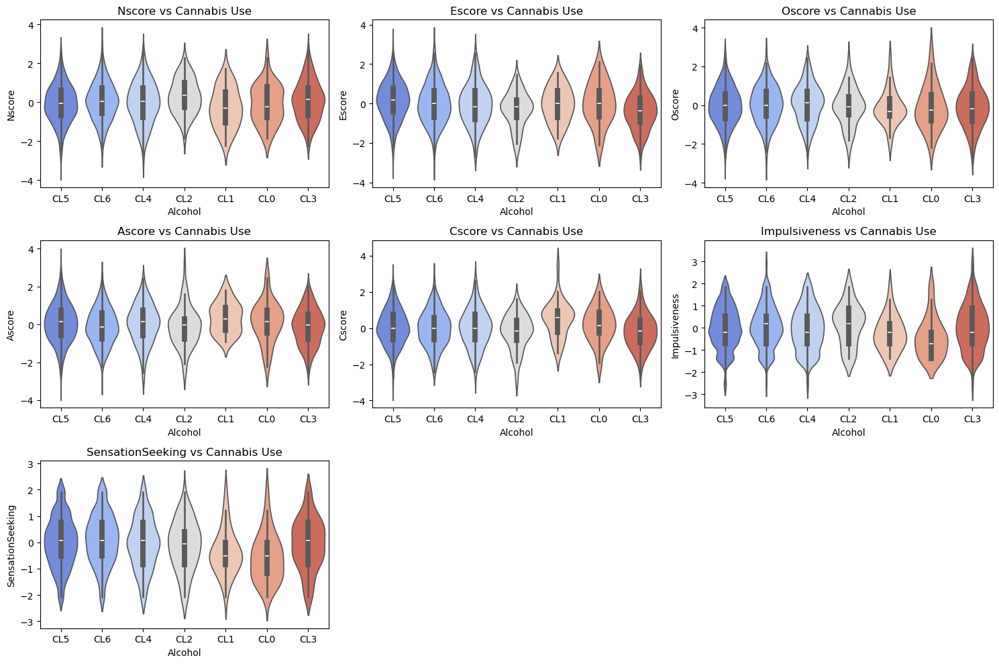

In [162]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = math.ceil(num_vars / num_cols)

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1) 
    sns.violinplot(x=df['Alcohol'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Cannabis Use")

plt.tight_layout()
plt.show()

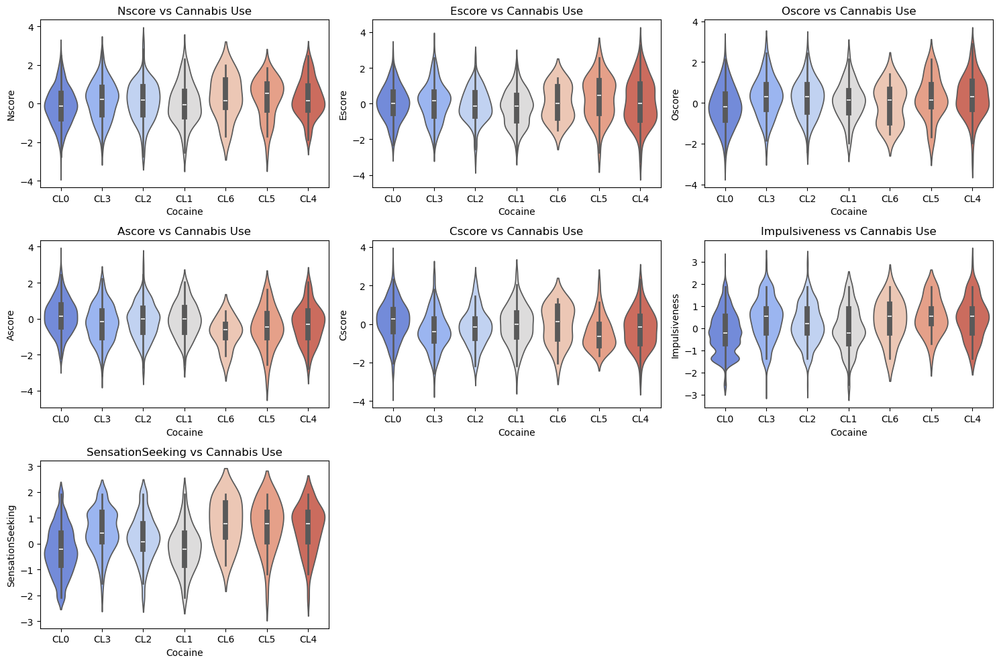

In [164]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = math.ceil(num_vars / num_cols)

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['Cocaine'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Cannabis Use")

plt.tight_layout()
plt.show()

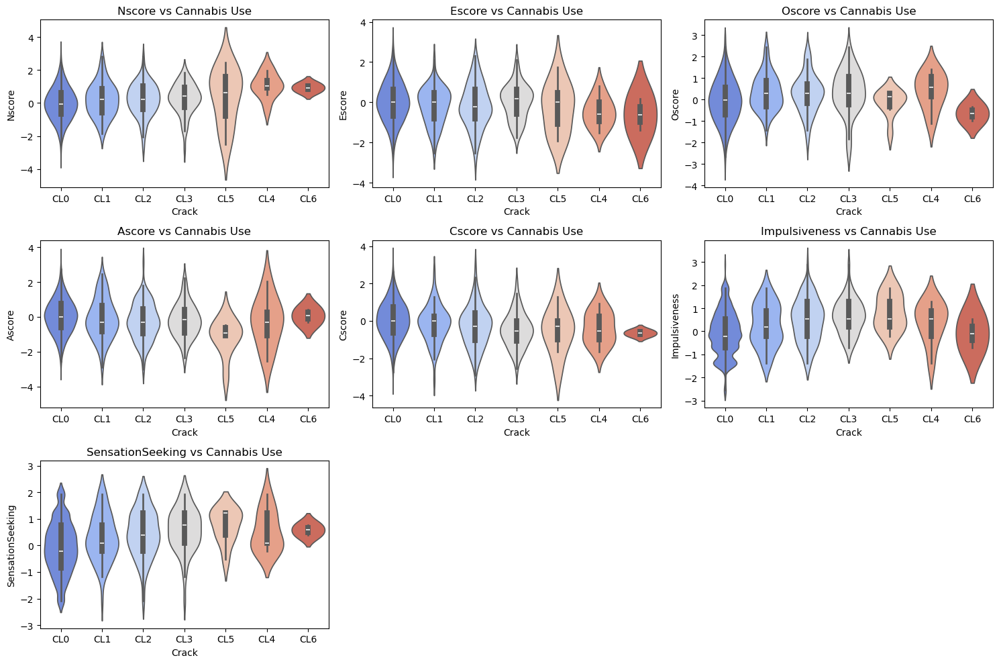

In [170]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = math.ceil(num_vars / num_cols)

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['Crack'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Cannabis Use")

plt.tight_layout()
plt.show()

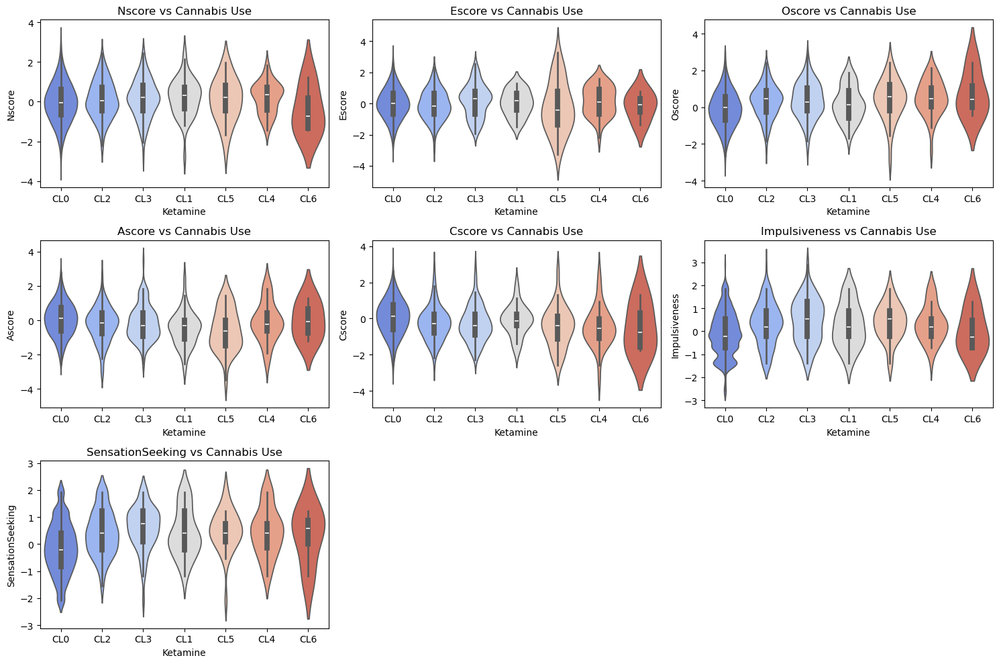

In [172]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = math.ceil(num_vars / num_cols)

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['Ketamine'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Cannabis Use")

plt.tight_layout()
plt.show()

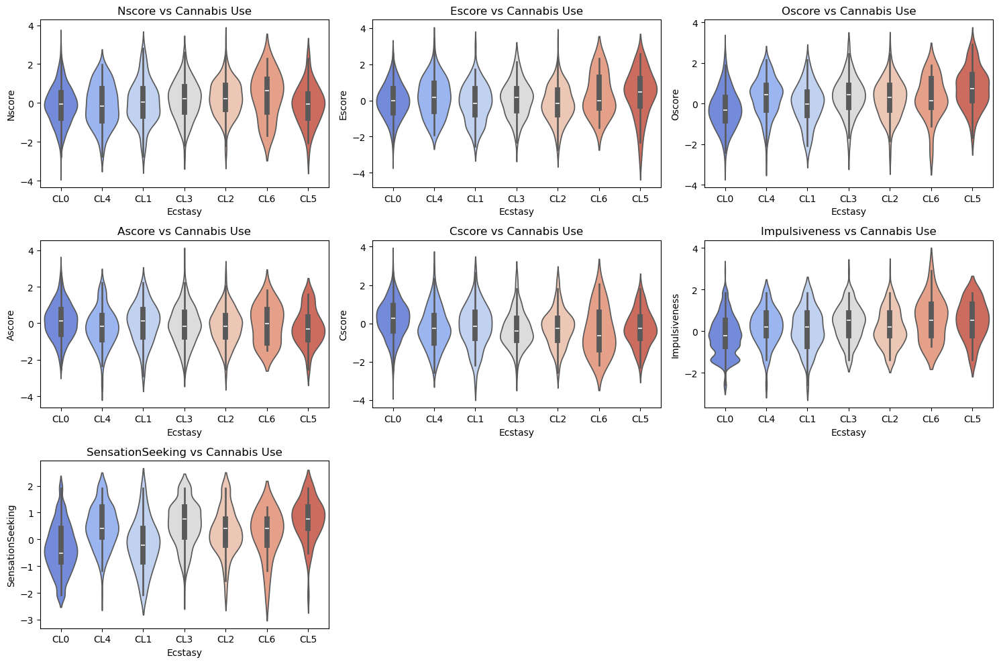

In [181]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = math.ceil(num_vars / num_cols)

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['Ecstasy'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Cannabis Use")

plt.tight_layout()
plt.show()

# Pairplot for Personality Traits vs Drug Use

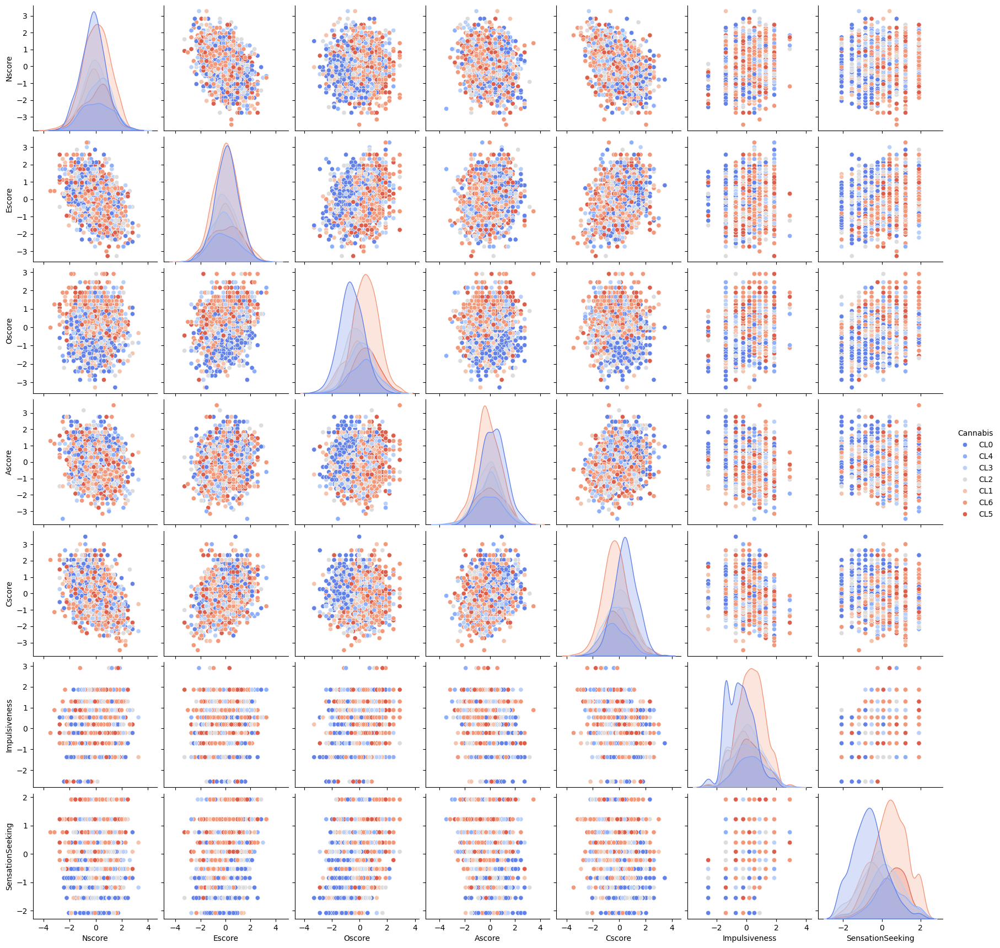

In [183]:
sns.pairplot(df, vars=trait_scores, hue="Cannabis", palette="coolwarm", diag_kind="kde")
plt.show()

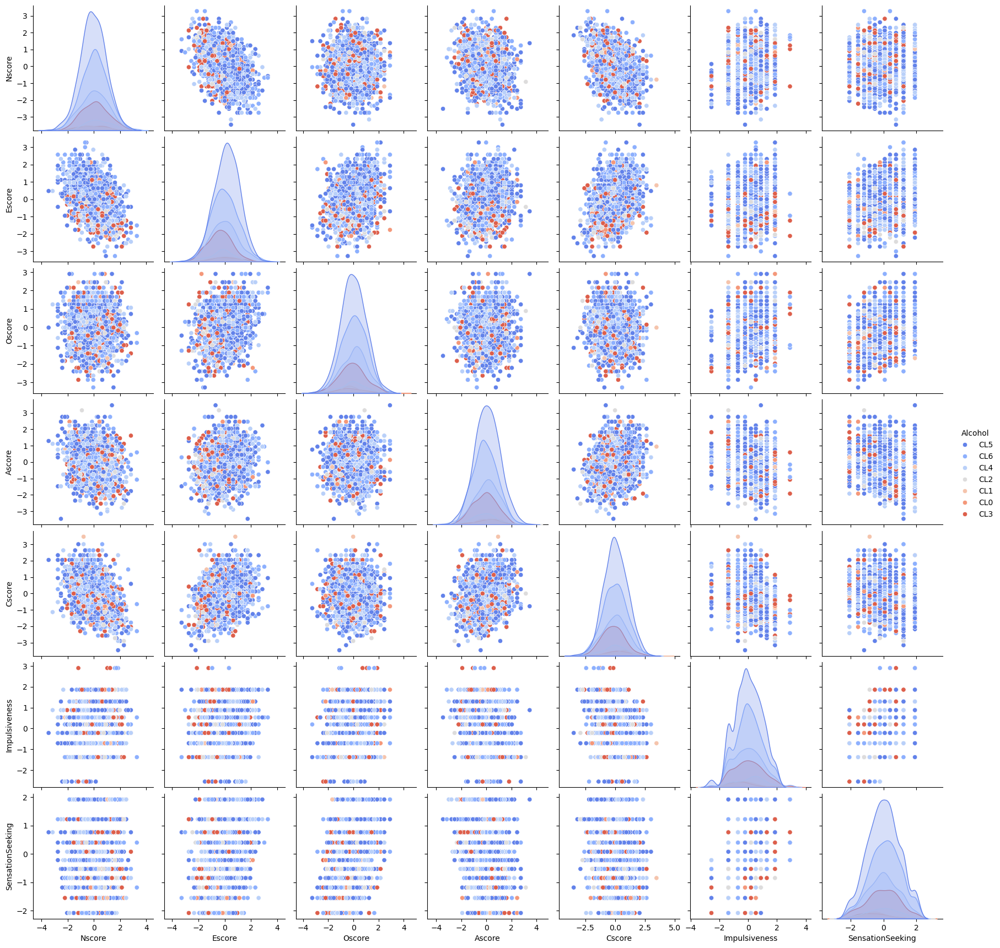

In [188]:
sns.pairplot(df, vars=trait_scores, hue='Alcohol', palette="coolwarm", diag_kind="kde")
plt.show()

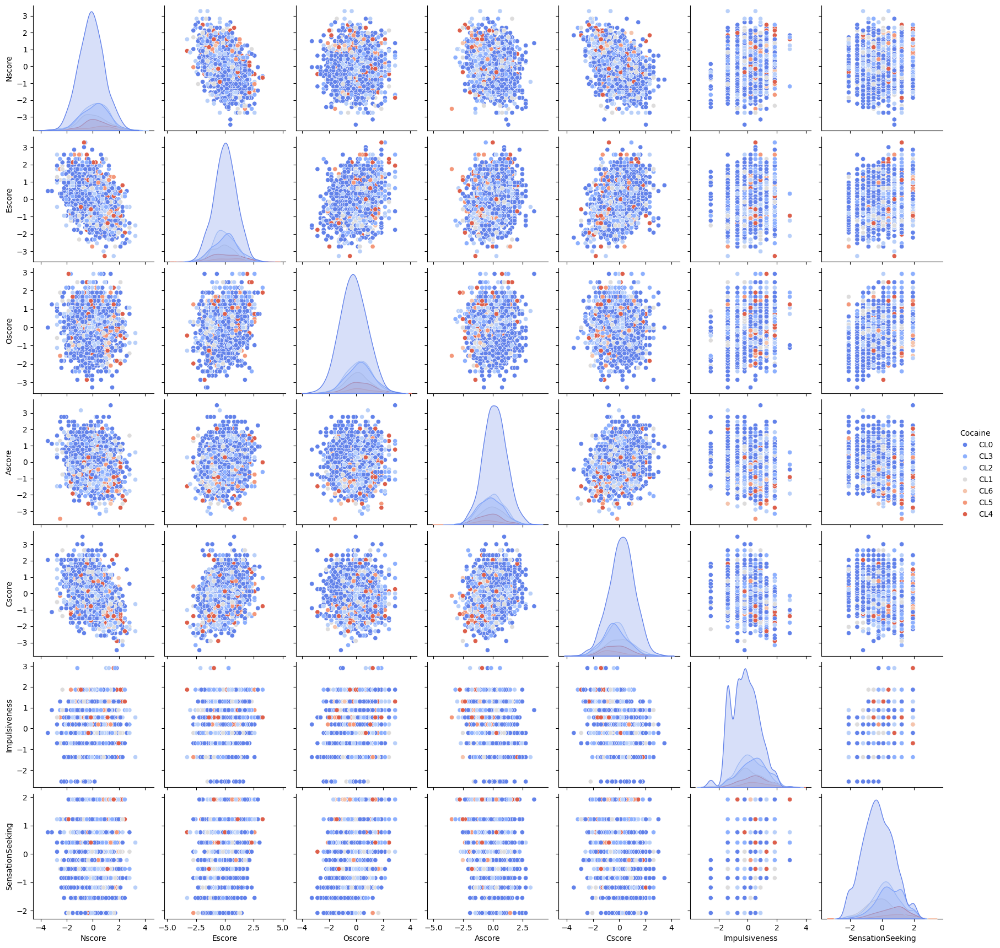

In [189]:
sns.pairplot(df, vars=trait_scores, hue='Cocaine', palette="coolwarm", diag_kind="kde")
plt.show()

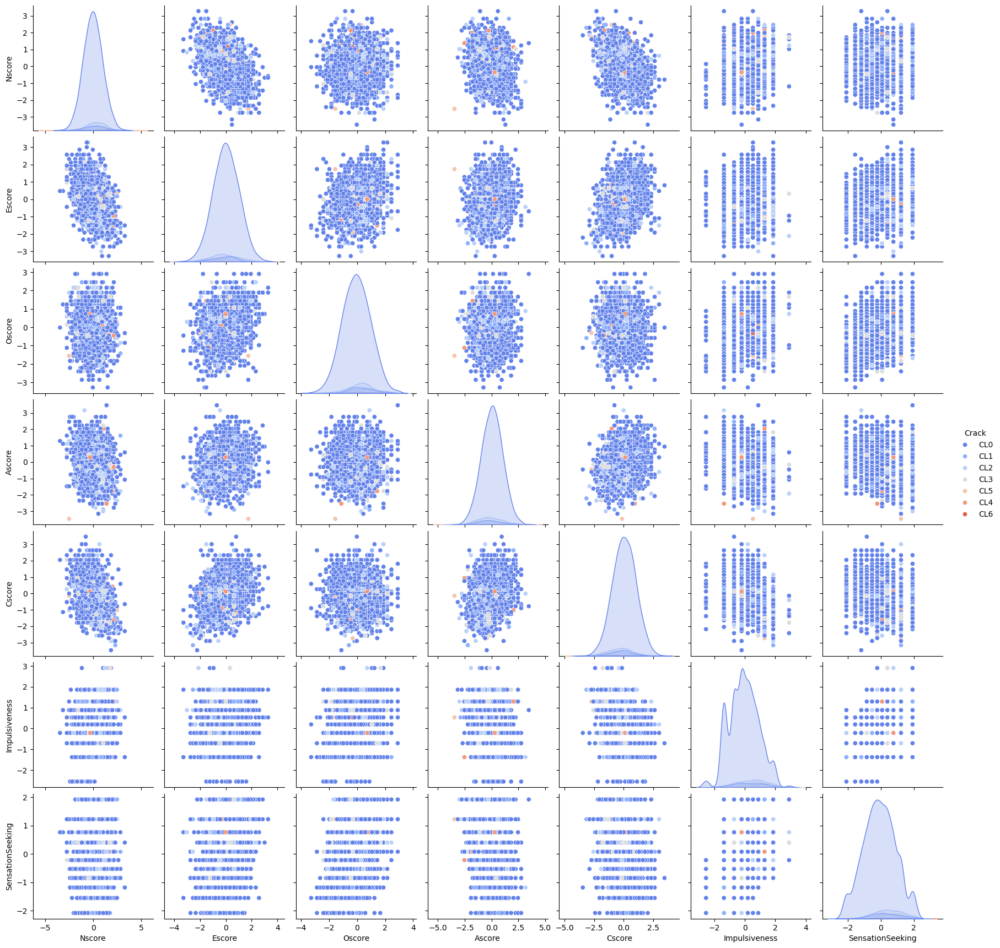

In [192]:
sns.pairplot(df, vars=trait_scores, hue='Crack', palette="coolwarm", diag_kind="kde")
plt.show()

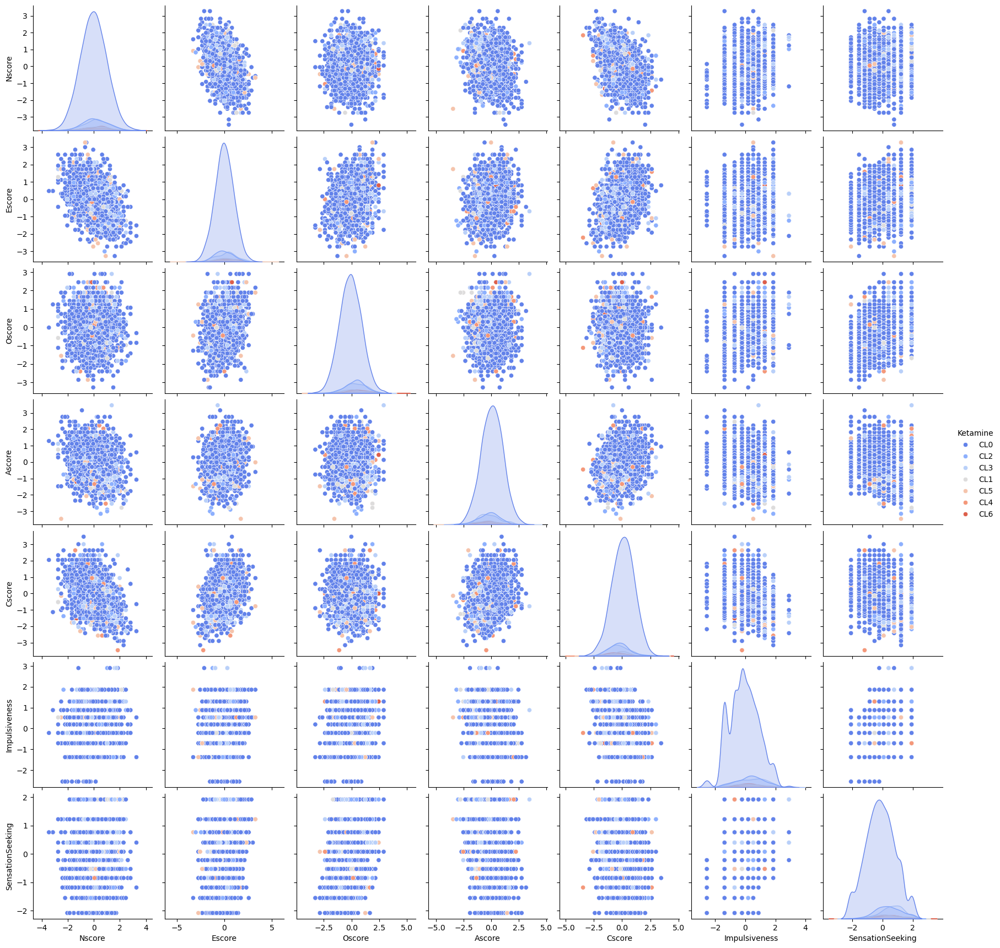

In [194]:
sns.pairplot(df, vars=trait_scores, hue='Ketamine', palette="coolwarm", diag_kind="kde")
plt.show()

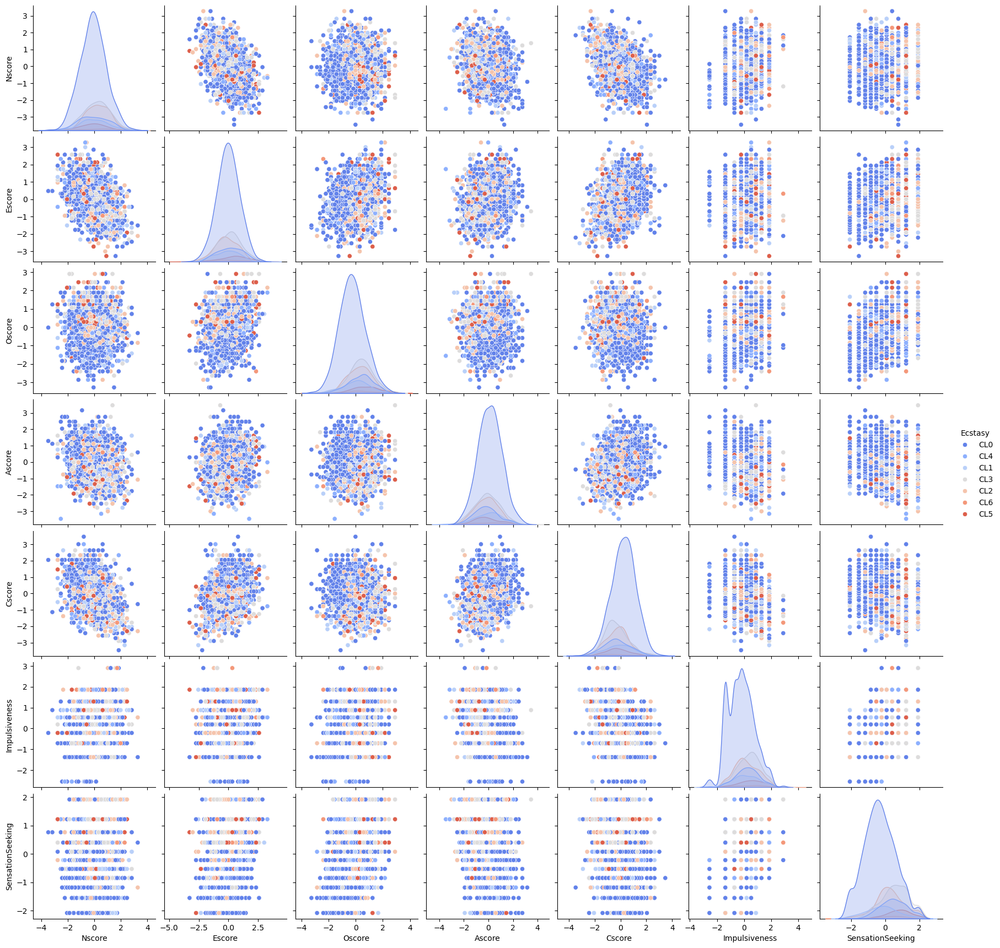

In [195]:
sns.pairplot(df, vars=trait_scores, hue='Ecstasy', palette="coolwarm", diag_kind="kde")
plt.show()

# Data Binning for further EDA

In [202]:

age_map = {
    -0.95197: "18-24",
    -0.07854: "25-34",
    0.49788: "35-44",
    1.09449: "45-54",
    1.82213: "55-64",
    2.59171: "65+"
}

gender_map = {
    0.48246: "Female",
    -0.48246: "Male"
}

education_map = {
    -2.43591: "Left school before 16 years",
    -1.73790: "Left school at 16 years",
    -1.43719: "Left school at 17 years",
    -1.22751: "Left school at 18 years",
    -0.61113: "Some college or university, no certificate or degree",
    -0.05921: "Professional certificate/diploma",
    0.45468: "University degree",
    1.16365: "Masters degree",
    1.98437: "Doctorate degree"
}

country_map = {
    -0.09765: "Australia",
    0.24923: "Canada",
    -0.46841: "New Zealand",
    -0.28519: "Other",
    0.21128: "Republic of Ireland",
    0.96082: "UK",
    -0.57009: "USA"
}

ethnicity_map = {
    -0.50212: "Asian",
    -1.10702: "Black",
    1.90725: "Mixed-Black/Asian",
    0.12600: "Mixed-White/Asian",
    -0.22166: "Mixed-White/Black",
    0.11440: "Other",
    -0.31685: "White"
}

# Creating thek new DataFrame with categorical values
df_categorical = df.copy()
df_categorical["Age"] = df["Age"].replace(age_map)
df_categorical["Gender"] = df["Gender"].replace(gender_map)
df_categorical["Education"] = df["Education"].replace(education_map)
df_categorical["Country"] = df["Country"].replace(country_map)
df_categorical["Ethnicity"] = df["Ethnicity"].replace(ethnicity_map)
df_categorical

,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,...,Ecstasy,Heroin,Ketamine,LegalHighs,LSD,Methadone,Mushrooms,Nicotine,Semer,VolatileSubstances
0,1,35-44,Female,Professional certificate/diploma,UK,Mixed-White/Asian,0.31287,-0.57545,-0.58331,-0.91699,...,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,2,25-34,Male,Doctorate degree,UK,White,-0.67825,1.93886,1.43533,0.76096,...,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,3,35-44,Male,Professional certificate/diploma,UK,White,-0.46725,0.80523,-0.84732,-1.62090,...,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,4,18-24,Female,Masters degree,UK,White,-0.14882,-0.80615,-0.01928,0.59042,...,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,5,35-44,Female,Doctorate degree,UK,White,0.73545,-1.63340,-0.45174,-0.30172,...,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,1884,18-24,Female,"Some college or university, no certificate or ...",USA,White,-1.19430,1.74091,1.88511,0.76096,...,CL0,CL0,CL0,CL3,CL3,CL0,CL0,CL0,CL0,CL5
1881,1885,18-24,Male,"Some college or university, no certificate or ...",USA,White,-0.24649,1.74091,0.58331,0.76096,...,CL2,CL0,CL0,CL3,CL5,CL4,CL4,CL5,CL0,CL0
1882,1886,25-34,Female,University degree,USA,White,1.13281,-1.37639,-1.27553,-1.77200,...,CL4,CL0,CL2,CL0,CL2,CL0,CL2,CL6,CL0,CL0
1883,1887,18-24,Female,"Some college or university, no certificate or ...",USA,White,0.91093,-1.92173,0.29338,-1.62090,...,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL4,CL0,CL0


# Personality Scores by Categories

In [226]:
substances_to_plot = [
    "Cannabis", "Chocolate", "Cocaine", "Crack", "Ecstasy", "Heroin",
    "Ketamine", "LegalHighs", "LSD", "Methadone", "Mushrooms", "Nicotine"
]

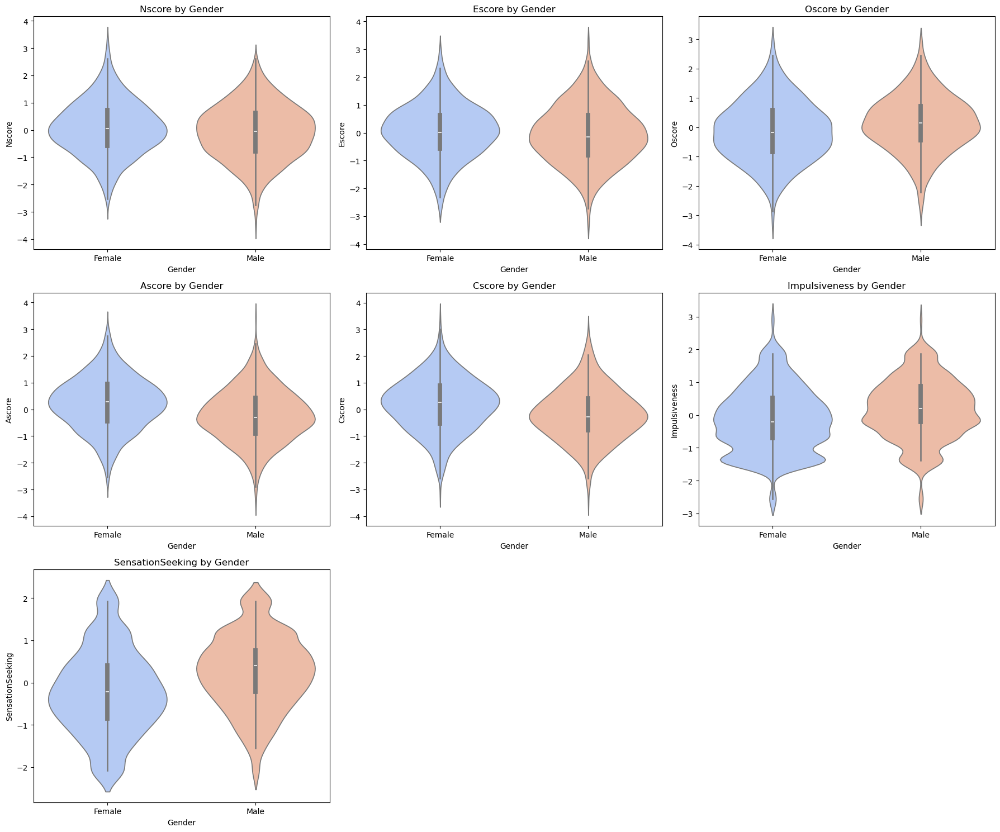

In [259]:
num_traits = len(trait_scores)
cols = 3 
rows = math.ceil(num_traits / cols)  

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows)) 
axes = axes.flatten() 

for i, col in enumerate(trait_scores):
    sns.violinplot(data=df_categorical, x="Gender", y=col, palette="coolwarm", ax=axes[i])
    axes[i].set_title(f"{col} by Gender")

for j in range(len(trait_scores), len(axes)):  
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


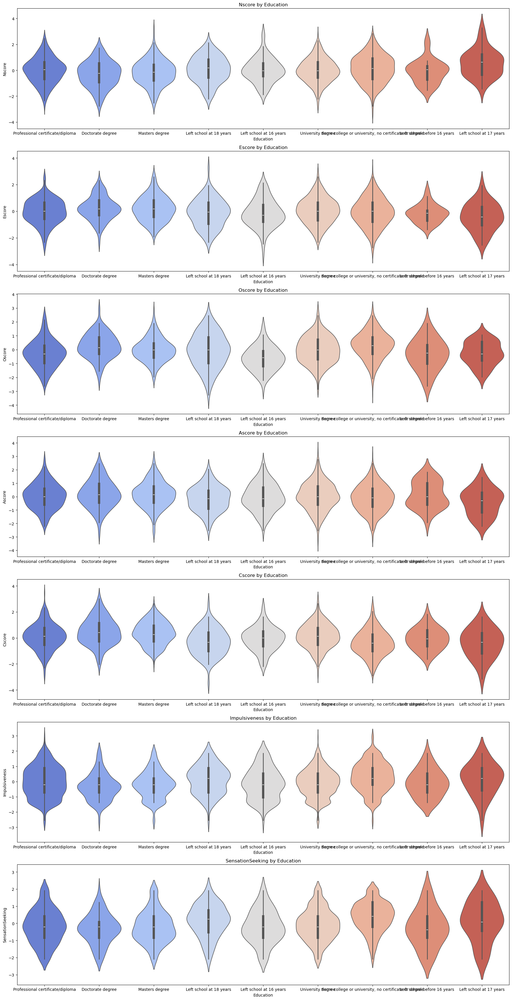

In [276]:
num_traits = len(trait_scores)
cols = 1 
rows = math.ceil(num_traits / cols)  

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows)) 
axes = axes.flatten() 

for i, col in enumerate(trait_scores):
    sns.violinplot(data=df_categorical, x="Education", y=col, palette="coolwarm", ax=axes[i])
    axes[i].set_title(f"{col} by Education")

for j in range(len(trait_scores), len(axes)):  
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

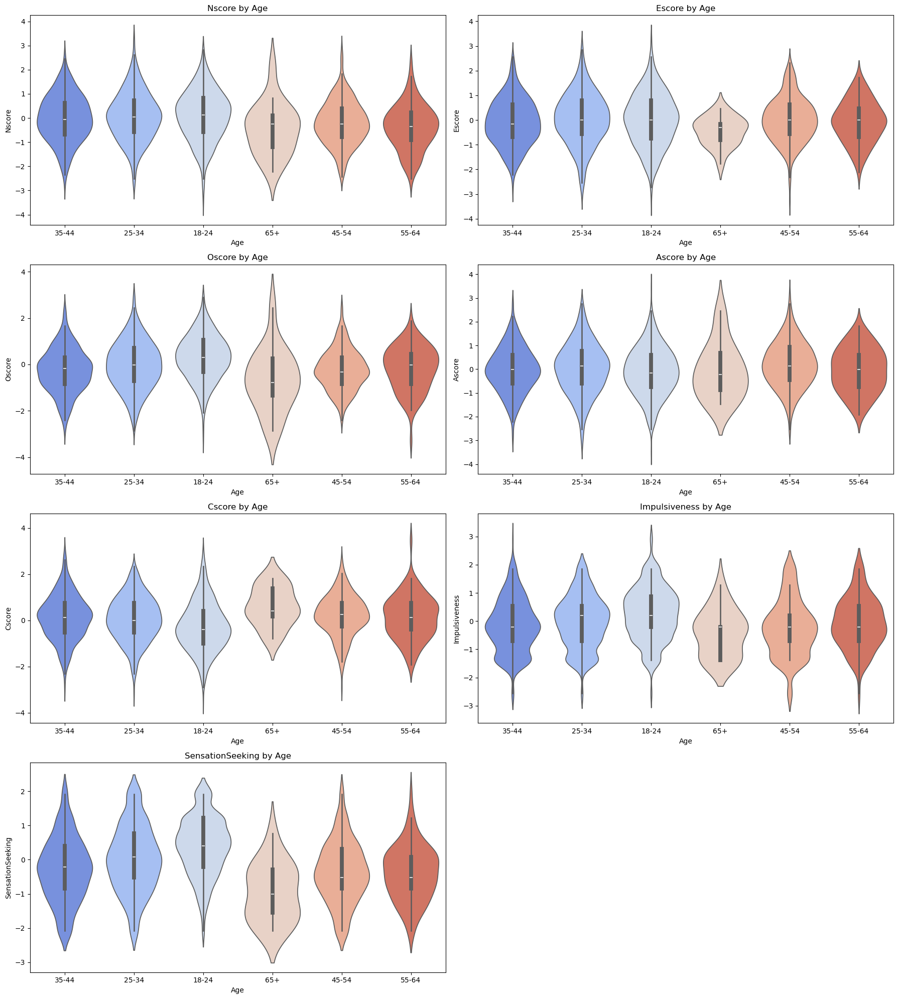

In [278]:
num_traits = len(trait_scores)
cols = 2 
rows = math.ceil(num_traits / cols)  

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows)) 
axes = axes.flatten() 

for i, col in enumerate(trait_scores):
    sns.violinplot(data=df_categorical, x="Age", y=col, palette="coolwarm", ax=axes[i])
    axes[i].set_title(f"{col} by Age")

for j in range(len(trait_scores), len(axes)):  
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

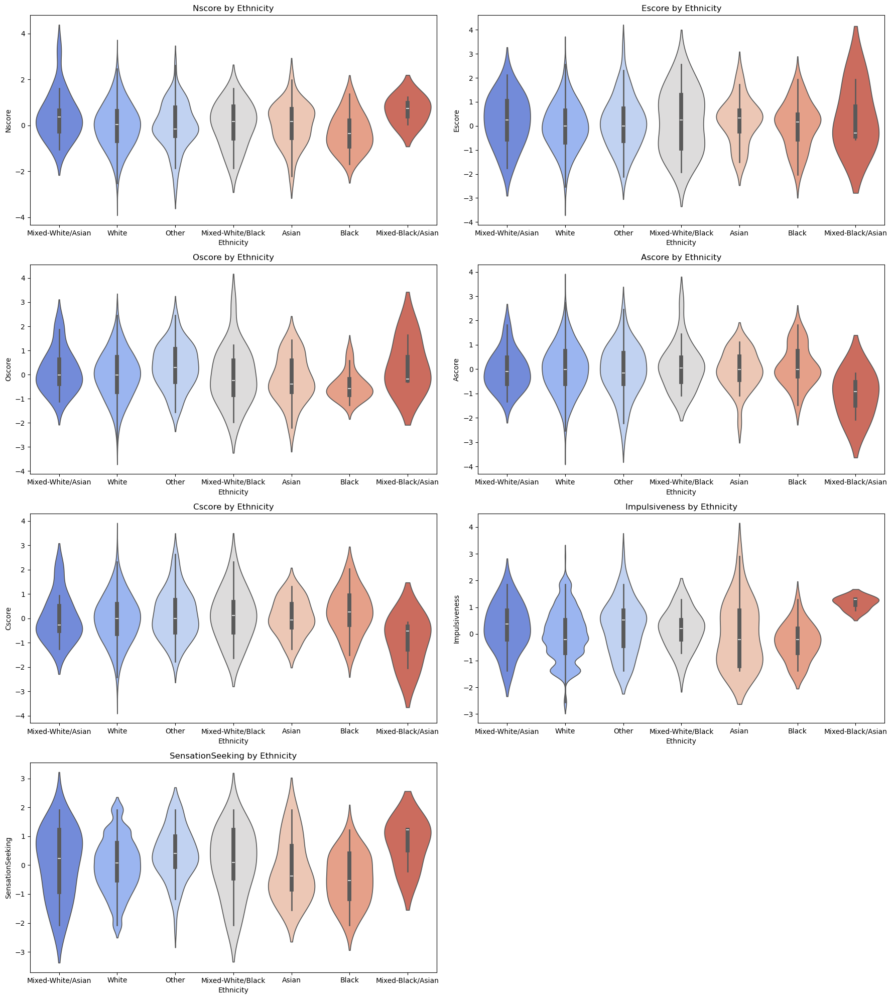

In [280]:
num_traits = len(trait_scores)
cols = 2
rows = math.ceil(num_traits / cols)  

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows)) 
axes = axes.flatten() 

for i, col in enumerate(trait_scores):
    sns.violinplot(data=df_categorical, x="Ethnicity", y=col, palette="coolwarm", ax=axes[i])
    axes[i].set_title(f"{col} by Ethnicity")

for j in range(len(trait_scores), len(axes)):  
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Age Distribution of Users

In [230]:
substances_to_plot = [
    "Cannabis", "Chocolate", "Cocaine", "Crack", "Ecstasy", "Heroin",
    "Ketamine", "LegalHighs", "LSD", "Methadone", "Mushrooms", "Nicotine"
]

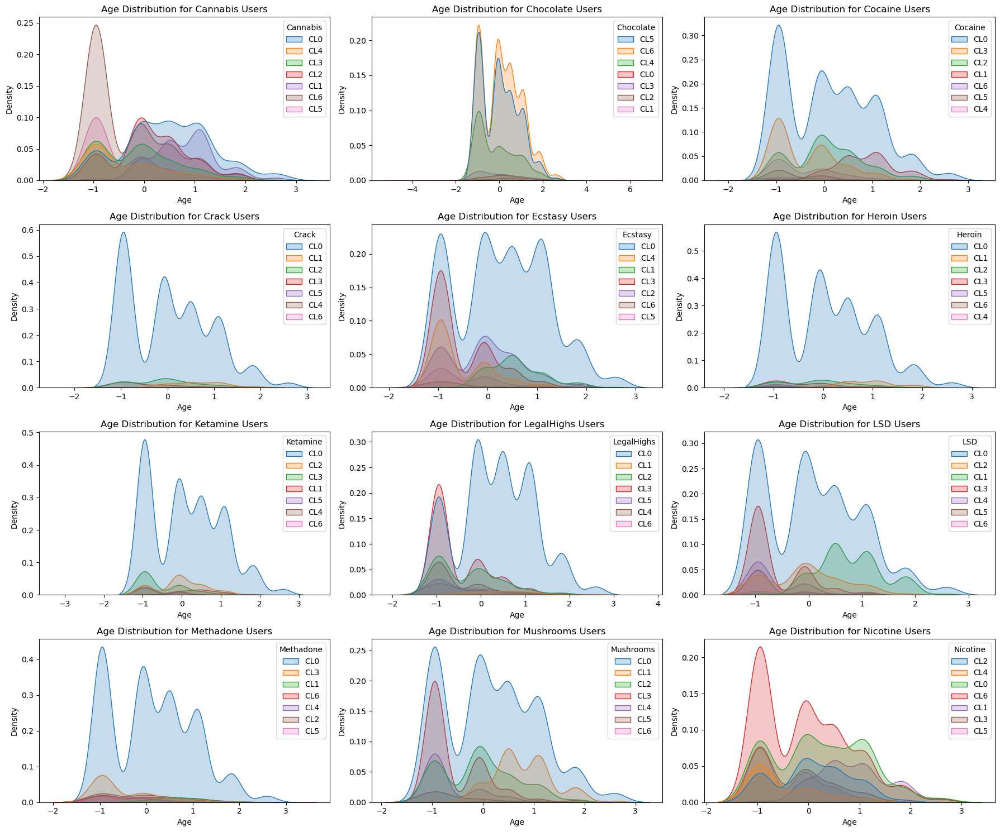

In [232]:
rows = 4
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(18, 15)) 
axes = axes.flatten() 

for i, substance in enumerate(substances_to_plot):
    sns.kdeplot(data=df, x="Age", hue=substance, fill=True, ax=axes[i])
    axes[i].set_title(f"Age Distribution for {substance} Users")

for j in range(len(substances_to_plot), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()




# Modes (Mostly PCA at the moment)

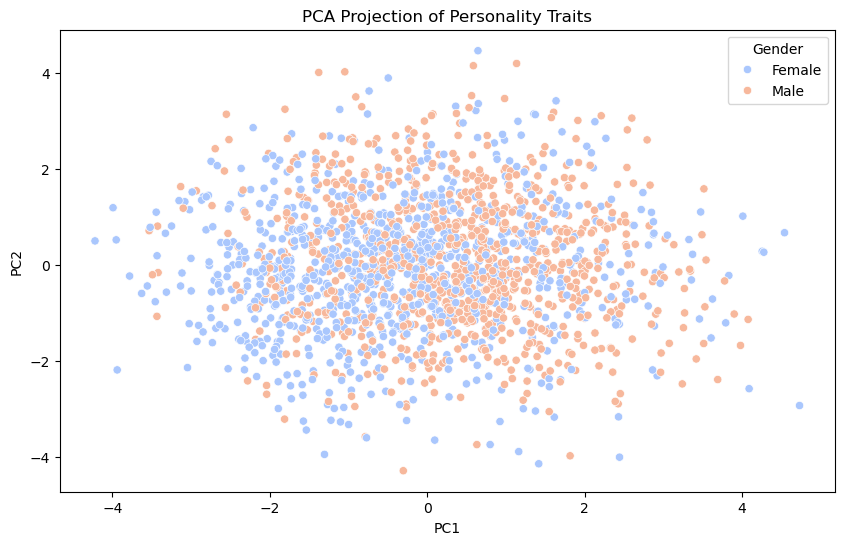

In [273]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_categorical[trait_scores])
df_categorical["PC1"], df_categorical["PC2"] = pca_result[:, 0], pca_result[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_categorical, x="PC1", y="PC2", hue="Gender", palette="coolwarm")
plt.title("PCA Projection of Personality Traits")
plt.show()

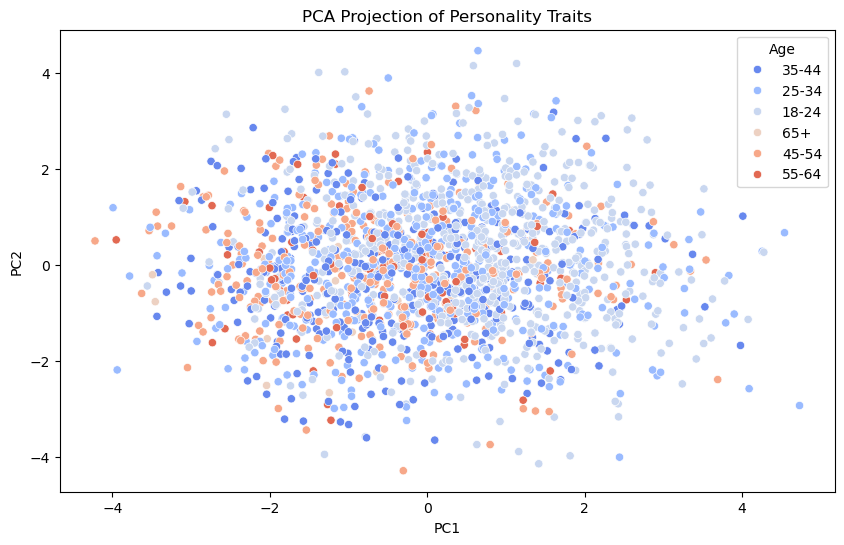

In [292]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_categorical[trait_scores])
df_categorical["PC1"], df_categorical["PC2"] = pca_result[:, 0], pca_result[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_categorical, x="PC1", y="PC2", hue="Age", palette="coolwarm")
plt.title("PCA Projection of Personality Traits")
plt.show()

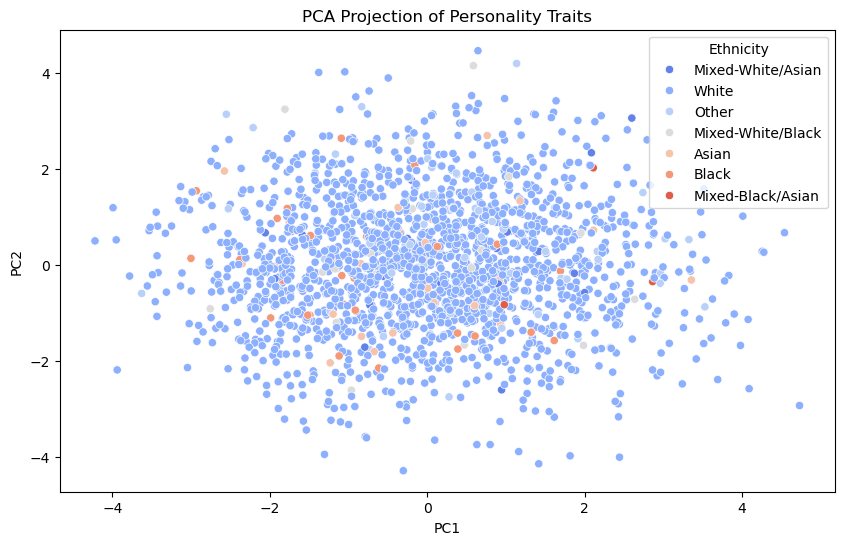

In [295]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_categorical[trait_scores])
df_categorical["PC1"], df_categorical["PC2"] = pca_result[:, 0], pca_result[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_categorical, x="PC1", y="PC2", hue="Ethnicity", palette="coolwarm")
plt.title("PCA Projection of Personality Traits")
plt.show()